# Import modules and establish connection to database
Import packages for handling, plotting and searching data. Set notebook options. 

Packages needed:
**pandas**, **seaborn**, **numpy**, **matplotlib**, **pymongo**, **networkx**, **sklearn**, **graphviz**, **pydotplus**

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from bson.objectid import ObjectId

%matplotlib inline
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 100)

sns.set_context("notebook", font_scale=1.25, rc={"lines.linewidth": 2})

Import pymongo to access database. Set up connection with given credentials to database: 

In [2]:
from pymongo import MongoClient
import pprint

client = MongoClient("141.5.113.177:27017")
client.smartshark_test.authenticate('group5', '5wSPez4h', mechanism='SCRAM-SHA-1')
db = client.smartshark_test

# Basic commands

All collections in the database (see http://smartshark2.informatik.uni-goettingen.de/documentation/ for more information).

In [3]:
print(db.collection_names())

['vcs_system', 'issue_system', 'code_entity_state', 'code_group_state', 'event', 'file', 'commit', 'file_action', 'plugin_schema', 'issue', 'project', 'issue_comment', 'tag', 'hunk', 'people', 'mailing_list', 'message', 'clone_instance']


Access a specific colletion get all items and store them in a pandas dataframe:

In [4]:
#pd.DataFrame(list(db.file_action.find()))

Search for specific _ObjectId_ in people collection: 

In [5]:
list(db.people.find({'_id': ObjectId('5853eb373ee1b95d618826f0')}))

[{'_id': ObjectId('5853eb373ee1b95d618826f0'),
  'email': 'henry@apache.org',
  'name': 'Henry Robinson',
  'username': 'henry'}]

# Commit times during project
The *author_date* and *commit_date* are the same, so there is no distinction between time of written code and time of commit. The offset of the time is nearly always zero and will not be taken into account here. 

In [6]:
from matplotlib import dates

commits = db.commit
dates_commits = list(commits.find({},{'author_date':1, '_id':0}))
dates_commits = [d['author_date'] for d in dates_commits]

commits_weekdays = [d.strftime("%A") for d in dates_commits]

dates_commits = dates.date2num(dates_commits)
times = (dates_commits+0.66) % 1 + int(dates_commits[0]) 

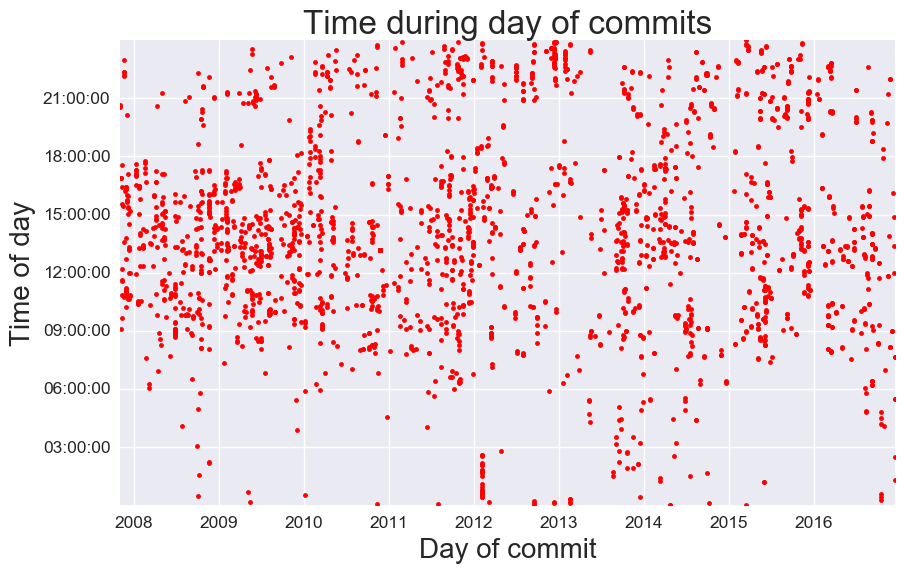

In [7]:
# Plot time of commits for each day
fig = plt.figure(figsize = (10,6))
ax = fig.add_subplot(111)
ax.yaxis_date()
plt.plot_date(dates_commits, times, 'r.')
plt.title ('Time during day of commits',fontsize=24)
plt.xlabel('Day of commit',             fontsize=20)
plt.ylabel('Time of day',               fontsize=20)

# Number of code lines added during project

In [8]:
# Load commits and lines added (from file_actions) into DataFrames
df_lines_added = pd.DataFrame(list(db.file_action.find({},{'lines_added':1, 'commit_id':1, '_id':0})))
df_commit_time = pd.DataFrame(list(db.commit.find({},{'author_date':1})))

In [9]:
# Join file_actions with commits on commit_id to get timestamps for added lines.
df_lines_date = pd.merge(df_lines_added, df_commit_time, how='inner', left_on='commit_id', right_on='_id', left_index=False, right_index=False)[['lines_added','author_date']]
# Sort added_lines by date
df_lines_date = df_lines_date.sort_values('author_date').reset_index()

After quick initial development, the number of added code lines decreases with time. Two jumps are clearly visible -> Data inconsistency? Duplicated entries? Or just jumps because some bigger testpiece was incorporated into the codebase.

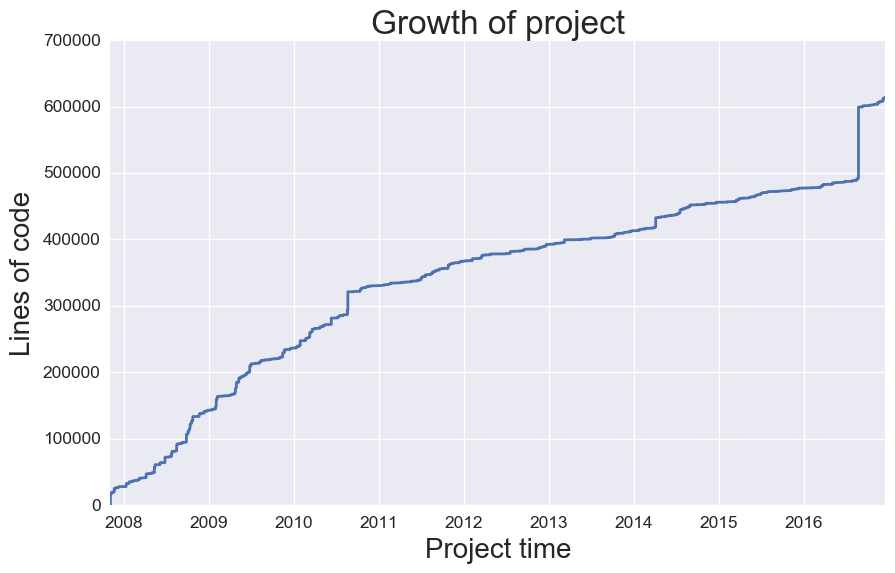

In [10]:
# Plot cumulative sum of added_lines to see project growth over time
fig = plt.figure(figsize=(10,6))
ax = plt.plot(df_lines_date['author_date'],np.cumsum(df_lines_date['lines_added']))
plt.title('Growth of project', fontsize=24); 
plt.xlabel('Project time'    , fontsize=20); 
plt.ylabel('Lines of code'   , fontsize=20);
fig.savefig('tex/fig/lines_of_code.png')

In [11]:
# Added lines of code for each file_action
#fig = plt.figure(figsize=(12,8))
#ax = plt.plot(df_lines_date['author_date'],df_lines_date['lines_added'], '.')
#plt.title('Growth of project'); plt.xlabel('Project time'); plt.ylabel('Lines of code')

# Clustering people w.r.t. work intensity
Aggregate number of commits, number of added and deleted code lines from different commits and file_actions. Aggregate these for people.

In [12]:
df_people = pd.DataFrame.from_dict(list(db.people.find({},{'email':0, 'username':0})))
df_commits = pd.DataFrame.from_dict(list(db.commit.find({},{'author_id':1, '_id':1})))
df_lines = pd.DataFrame.from_dict(list(db.file_action.find({},{'lines_added':1, 'lines_deleted': 1, 'commit_id':1, '_id':0}))).groupby('commit_id', as_index = False).sum()

Merge datasets and group by *author_ids* to get sum of lines and commits:

In [13]:
df_commit_lines = pd.merge(df_commits, df_lines, left_on='_id', right_on='commit_id')
df_commit_lines['num_commits'] = pd.Series(np.ones(len(df_commit_lines['author_id'])), index=df_commit_lines.index)
df_commit_lines = df_commit_lines.groupby('author_id', as_index=False).sum()

Clean up names, remove entry with no name, change duplicated entries with different names to same name:

In [14]:
df_people_all = pd.merge(df_commit_lines, df_people, left_on='author_id', right_on='_id').drop(['author_id', '_id'], axis=1)

people_dict = {"Raúl Gutiérrez Segalés":"Raul Segales", 
               "Raul Gutierrez Segales": "Raul Segales", 
               "Raul Gutierrez S":"Raul Segales",
               "Patrick D. Hunt": "Patrick Hunt",
               "fpj":"Flavio Paiva Junqueira"}

df_people_all.replace(people_dict, inplace=True)
df_people_all = df_people_all.groupby('name', as_index = False).sum()
df_people_all = df_people_all.drop(0)
df_people_all.set_index('name', inplace=True)

Scatter number of commits against number of code lines to see important people for the project (productiveness).

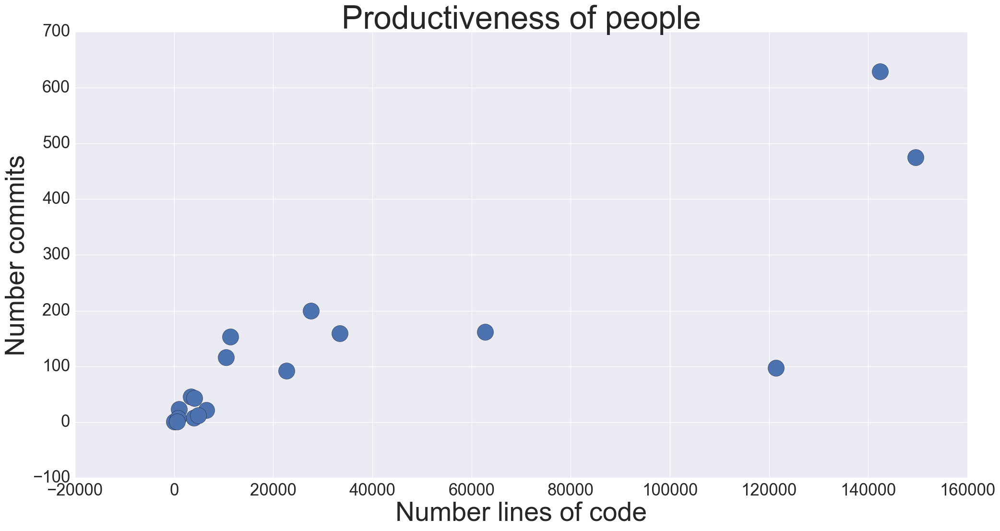

In [15]:
ax = df_people_all.plot.scatter('lines_added', 'num_commits', 600, figsize=(24,12))
ax.tick_params(axis='both', which='major', labelsize=25)
plt.ylabel("Number commits",             fontsize=40)
plt.xlabel("Number lines of code",       fontsize=40)
plt.title ("Productiveness of people",   fontsize=48)
#plt.savefig('tex/fig/people.png', transparent = False)

Cluster people with respect to their productiveness. 

In [16]:
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN

In [17]:
df_people_normalised = df_people_all.apply(lambda x: (x - np.mean(x)) / (np.max(x) - np.min(x)))
C = AgglomerativeClustering(n_clusters=2, linkage='ward')
C.fit(df_people_normalised[['lines_added', 'num_commits']])
colorMapping = {1: 'green', 0:'red'}
a = [colorMapping[d] for d in C.labels_]

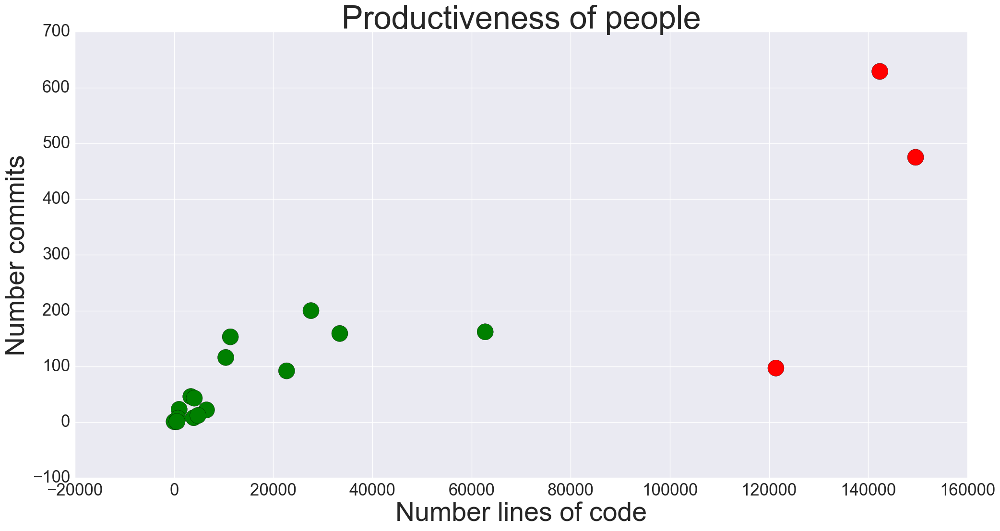

In [18]:
ax = df_people_all.plot.scatter('lines_added', 'num_commits', 600, a, figsize=(24,12))
ax.tick_params(axis='both', which='major', labelsize=25)
plt.ylabel("Number commits", fontsize=40)
plt.xlabel("Number lines of code", fontsize=40)
plt.title("Productiveness of people", fontsize=48)
#plt.savefig('tex/fig/people_clustered.png', transparent = False)

In [19]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

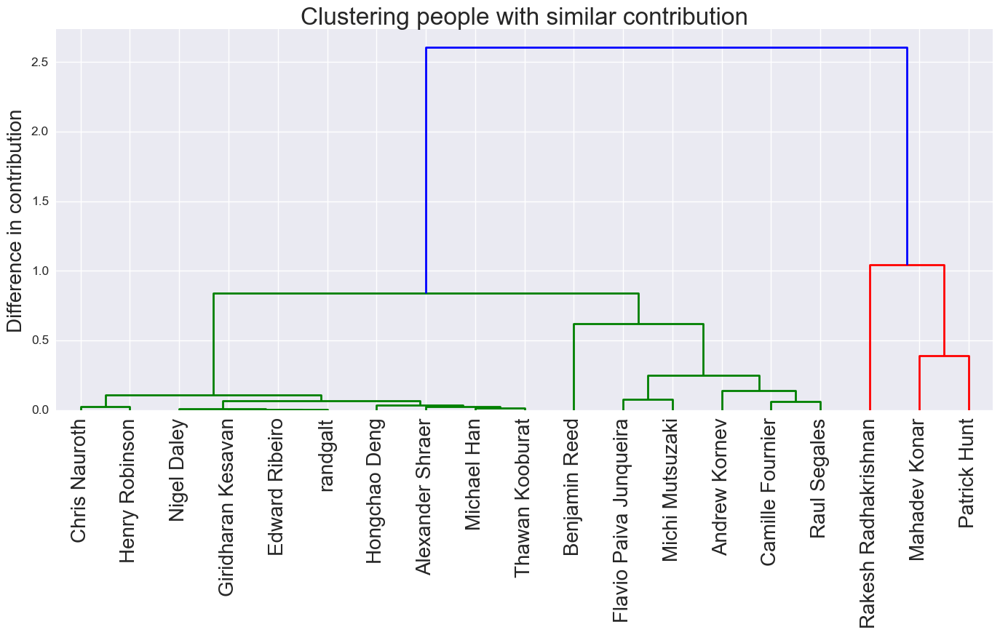

In [20]:
Z = linkage(df_people_normalised, 'ward')
fig = plt.figure(figsize=(14, 9))
plt.title('Clustering people with similar contribution', fontsize=24)
plt.ylabel('Difference in contribution',               fontsize=20)
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=20.,  # font size for the x axis labels
    labels=df_people_all.index,
)
plt.tight_layout()
#plt.savefig('tex/fig/dendrogram.png', transparent = True)

# Graph analysis of project files

In [21]:
# Import modules for graph analysis of project files
import graphviz as gv
import networkx as nx
import pydotplus
from networkx.drawing.nx_agraph import graphviz_layout

We will only look at the folder _src_ in the project. Other folders and also probably older hierarchies exist and can be seen by changing the commented line below: 

In [22]:
# Load file collection into variable with only the file path field
files = list(db.file.find({},{'_id':0, 'path':1}))

# Create directed graph that shows file hierarchy (all folders and no files)
G = nx.DiGraph()
for path in files:
    s = path['path'].split('/')
    if s[0] == 'src':       #----- Change to 'zookeeper' , 'docs' or other to see further folder structures
        i = 0
        currentPath = ""
        for folder in s[:-1]:
            oldPath = currentPath
            currentPath += "/" + folder
            if (i == 0):
                G.add_edge('root',currentPath)
            else:
                G.add_edge(oldPath, currentPath)
            i += 1

# Create node labels as folder name
node_dict = {}
for entry in G.nodes():
    s = entry.split('/')
    node_dict[entry] = s[-1]

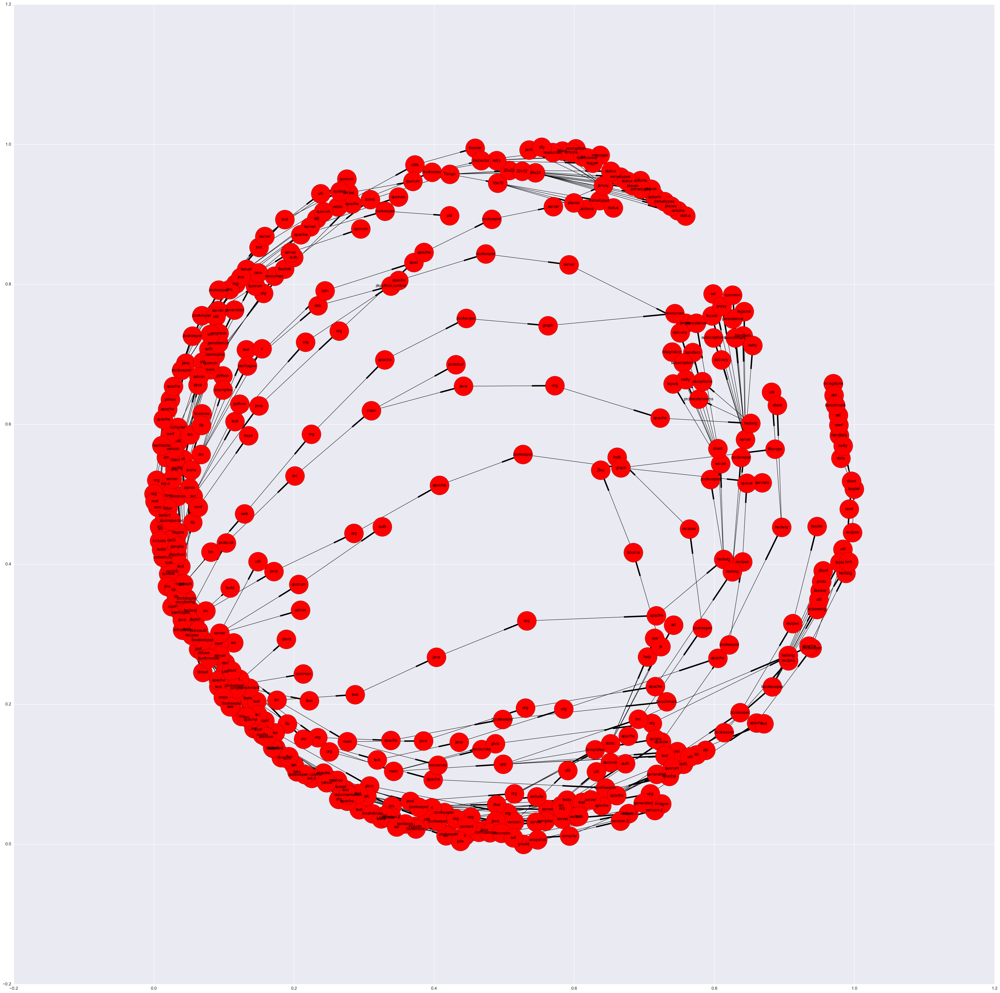

In [23]:
plt.figure(figsize=(50,50))
nx.draw_networkx(G, node_size=3000, labels=node_dict)#, node_color=node_colors)
plt.savefig('tex/fig/graph_complete_nx.png', transparent = True)

{'/src': <matplotlib.text.Text at 0x14b72d240>,
 '/src/c': <matplotlib.text.Text at 0x14b724400>,
 '/src/c/include': <matplotlib.text.Text at 0x14b784940>,
 '/src/c/src': <matplotlib.text.Text at 0x14b77be80>,
 '/src/c/src/hashtable': <matplotlib.text.Text at 0x14bb1c320>,
 '/src/c/tests': <matplotlib.text.Text at 0x14b5d9940>,
 '/src/contrib': <matplotlib.text.Text at 0x14b40ff60>,
 '/src/contrib/bookkeeper': <matplotlib.text.Text at 0x14b836860>,
 '/src/contrib/bookkeeper/benchmark': <matplotlib.text.Text at 0x14b82fda0>,
 '/src/contrib/bookkeeper/benchmark/org': <matplotlib.text.Text at 0x14b885320>,
 '/src/contrib/bookkeeper/benchmark/org/apache': <matplotlib.text.Text at 0x14b805320>,
 '/src/contrib/bookkeeper/benchmark/org/apache/bookkeeper': <matplotlib.text.Text at 0x14bb28860>,
 '/src/contrib/bookkeeper/benchmark/org/apache/bookkeeper/benchmark': <matplotlib.text.Text at 0x14b7a6cc0>,
 '/src/contrib/bookkeeper/conf': <matplotlib.text.Text at 0x14b772cc0>,
 '/src/contrib/bookke

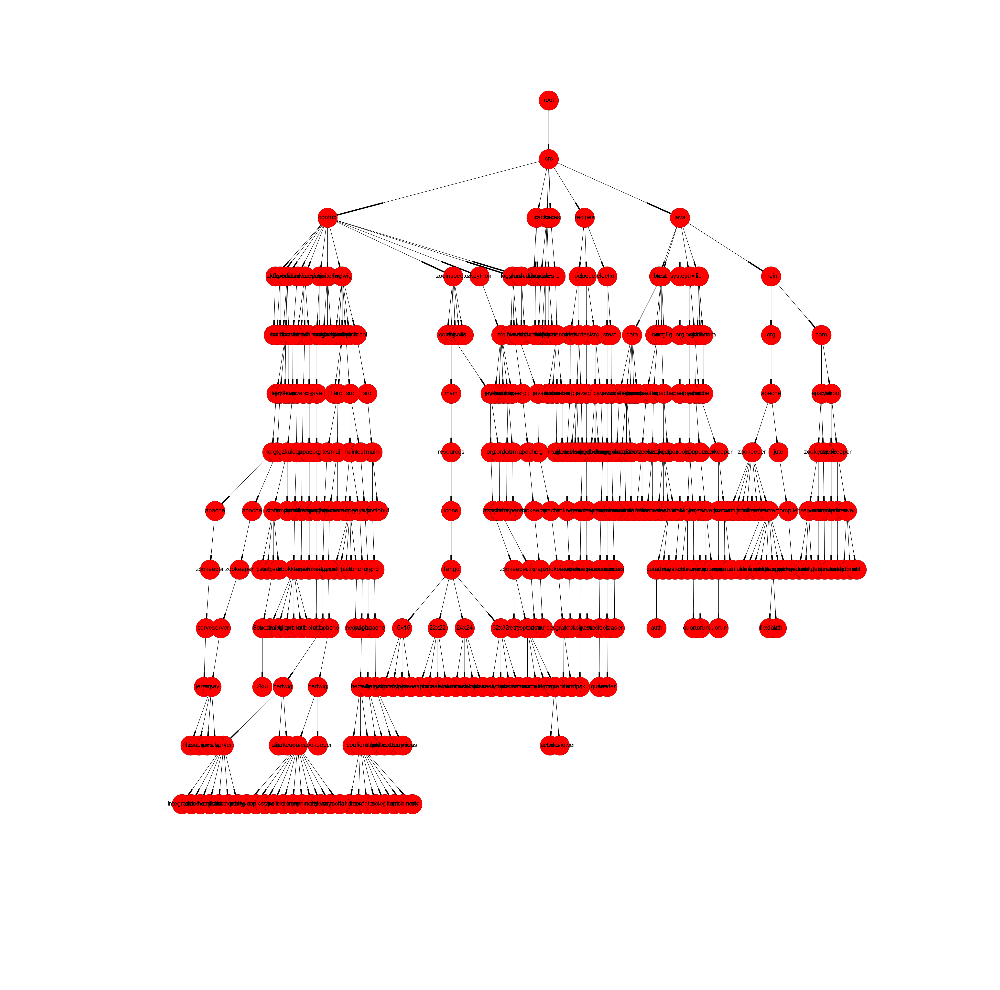

In [24]:
# Plot graph with labels as tree structure and save to png
plt.figure(figsize=(40,40))
positions = nx.nx_pydot.graphviz_layout(G, prog='dot')
nx.draw(G, pos=positions, prog='dot', node_size=3400)
nx.draw_networkx_labels(G, positions, labels=node_dict, font_size=18)#, font_color='k', font_family='sans-serif', font_weight='normal', alpha=1.0, bbox=None, ax=None, **kwds)
#plt.savefig('tex/fig/graph_complete.png', transparent = True)

In [25]:
dir()
del df_commits, df_commit_lines

## Merge authors with filenames
**Code below is even more unstructured and inefficient than before** 

Get all dataframes to associate people with added files (file modifications are not considered).

In [26]:
df_added_files = pd.DataFrame(list(db.file_action.find({'mode':'A'}, {'file_id':1, 'commit_id':1, '_id':0})))
df_people = pd.DataFrame(list(db.people.find({},{'name':1})))
df_commit = pd.DataFrame(list(db.commit.find({},{'author_id':1})))
df_file_paths = pd.DataFrame(list(db.file.find({},{'path':1})))

Merge dataframes to receive *df_files_people* that contains only people and file paths and select only main contributors.

In [27]:
df_commits_people = pd.merge(df_commit, df_people, left_on='author_id', right_on='_id').replace(people_dict).drop(['_id_y', 'author_id'], axis = 1)
df_files_people = pd.merge(df_added_files, df_commits_people, left_on='commit_id', right_on='_id_x').drop(['commit_id','_id_x'], axis=1)

In [28]:
df_files_people = pd.merge(df_files_people, df_file_paths, left_on='file_id', right_on='_id').drop(['file_id', '_id'], axis=1)
df_files_people['count'] = pd.Series(np.ones(len(df_files_people['name'])), index=df_files_people.index)

In [29]:
contributors = df_files_people[df_files_people['name'].isin(['Rakesh Radhakrishnan', 'Patrick Hunt', 'Mahadev Konar'])]

In [30]:
contributors['languages'] = [path.rsplit('.', 1)[-1] for path in contributors['path']]

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Group languages by main three contributors and sum up added files for each language. 

In [31]:
groups = contributors.groupby('name')
mk = groups.get_group('Mahadev Konar').drop(['name', 'path'], axis=1).groupby('languages').sum()
ph = groups.get_group('Patrick Hunt').drop(['name', 'path'], axis=1).groupby('languages').sum()
rr = groups.get_group('Rakesh Radhakrishnan').drop(['name', 'path'], axis=1).groupby('languages').sum()
mk.columns = ['Mahakev Konar']
ph.columns = ['Patrick Hunt']
rr.columns = ['Rakesh Radhakrishnan']

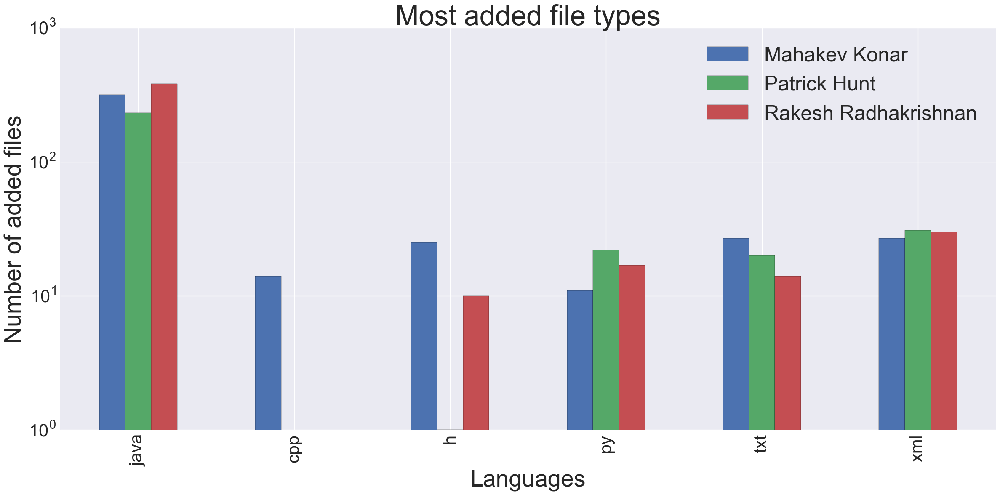

In [32]:
ax = pd.concat([mk, ph, rr], axis=1, join_axes=[mk.index]).loc[['java', 'cpp','h', 'py', 'txt', 'xml']].plot.bar(figsize=(24,12))
ax.legend(loc=1,prop={'size':35})
ax.tick_params(axis='both', which='major', labelsize=30)
plt.yscale('log')
plt.ylabel('Number of added files', fontsize = 40)
plt.xlabel('Languages', fontsize=40)
plt.title('Most added file types', fontsize=48)
plt.tight_layout()
#plt.savefig('tex/fig/languages.png', transparent=False)

# Most number of added files for directories

In [33]:
contributors['short_path'] = ['/' + path.rsplit('/', 1)[0] for path in contributors['path']]

//anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [34]:
df_path_names = contributors.drop(['path', 'languages'], axis=1)
df_path_names = df_path_names.groupby(['short_path', 'name']).count()

In [35]:
node_colors = np.zeros(len(G.nodes()))
i = 0
for path in G.nodes():
    node_colors[i] = 3
    try: 
        curMax = 0
        if (df_path_names.loc[path, 'Mahadev Konar']['count'] > curMax):
            curMax = df_path_names.loc[path, 'Mahadev Konar']['count']
            node_colors[i] = 0;
        if (df_path_names.loc[path, 'Patrick Hunt']['count'] > curMax):
            curMax = df_path_names.loc[path, 'Patrick Hunt']['count']
            node_colors[i] = 1;
        if (df_path_names.loc['/src/java/test/org/apache/zookeeper', 'Rakesh Radhakrishnan']['count'] > curMax):
            curMax = df_path_names.loc[path, 'Rakesh Radhakrishnan']['count']
            node_colors[i] = 2;
    except KeyError:
        ;
        #print('No commits for this folder by the three persons')
    i += 1

In [36]:
# Plot graph with labels as tree structure and save to png
plt.figure(figsize=(150,150))
positions = nx.nx_pydot.graphviz_layout(G, prog='dot')
plt.set_cmap('Set1')
nx.draw(G, pos=positions, prog='dot', node_size=12000, node_color=node_colors, vmax=9, width=4)
nx.draw_networkx_labels(G, positions, labels=node_dict, font_size=35)
plt.savefig('tex/fig/graph_complete.png', transparent = True)

### Unfinished:

Do regression for number of added lines based on author, time added, date added, language used

In [37]:
df_people = pd.DataFrame.from_dict(list(db.people.find({},{'email':0, 'username':0})))
df_commits = pd.DataFrame.from_dict(list(db.commit.find({},{'author_id':1, '_id':1, 'author_date':1})))
df_lines = pd.DataFrame.from_dict(list(db.file_action.find({},{'lines_added':1, 'lines_deleted': 1, 'commit_id':1, '_id':0}))).groupby('commit_id', as_index = False).sum()

df_commit_lines = pd.merge(df_commits, df_lines, left_on='_id', right_on='commit_id')
df_commit_lines['num_commits'] = pd.Series(np.ones(len(df_commit_lines['author_id'])), index=df_commit_lines.index)
df_commit_lines = df_commit_lines.groupby('author_id', as_index=False).sum()

df_people_all = pd.merge(df_commit_lines, df_people, left_on='author_id', right_on='_id').drop(['author_id', '_id'], axis=1)

people_dict = {"Raúl Gutiérrez Segalés":"Raul Segales", 
               "Raul Gutierrez Segales": "Raul Segales", 
               "Raul Gutierrez S":"Raul Segales",
               "Patrick D. Hunt": "Patrick Hunt",
               "fpj":"Flavio Paiva Junqueira"}

df_people_all.replace(people_dict, inplace=True)
#df_people_all = df_people_all.groupby('name', as_index = False).sum()
#df_people_all = df_people_all.drop(0)
#df_people_all.set_index('name', inplace=True)

Who wrote how many messages

In [38]:
df_messages = pd.DataFrame(list(db.message.find({},{'from_id':1})))
df_people_all = pd.merge(df_commit_lines, df_people, left_on='author_id', right_on='_id').drop(['_id'], axis=1)
first_slide = df_people_all.merge(df_messages.groupby('from_id', as_index = False).count(), left_on='author_id', right_on='from_id').drop(['author_id', 'from_id'], axis=1)

In [39]:
first_slide.columns = ['Lines added', 'Lines deleted', 'Number commits', 'Example persons', 'Number messages']
first_slide.set_index('Example persons', inplace=True)

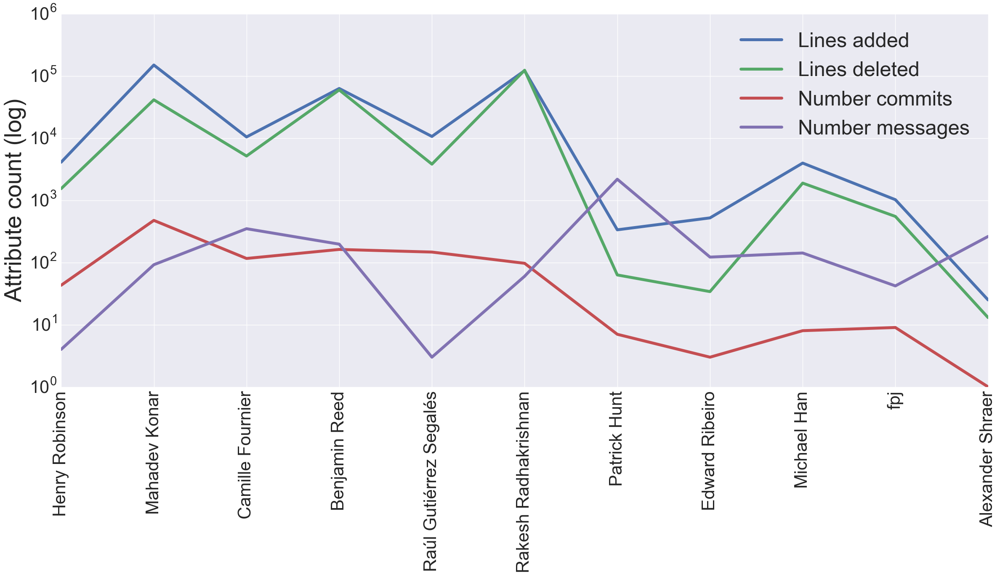

In [40]:
ax = first_slide.plot(rot=90, figsize=(24,14), linewidth=5)
plt.xticks(range(0,11), list(first_slide.index))
ax.legend(loc=1,prop={'size':35})
ax.tick_params(axis='both', which='major', labelsize=30)
ax.set_yscale('log')
ax.set_ylabel('Attribute count (log)', fontsize = 40)
ax.set_xlabel('', fontsize = 40)
locs, labels = plt.xticks()
plt.tight_layout()
plt.savefig('tex/fig/first_slide.png')